# Implementing clustering for the antobody mean escape over time.

This line gets rid of some warnings about the packages when you run the code:

In [1]:
import warnings
warnings.filterwarnings('ignore')

Download necessary package versions

In [2]:
#!conda install -y numpy=1.24

In [3]:
#!pip install umap-learn

In [4]:
#!pip install hdbscan

Import Python packages

In [5]:
import os
import glob
from collections import defaultdict
import pandas as pd

#Packages for plotting
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import matplotlib.colors as colors

#Packages for K Means Clustering: 
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
import numpy as np

#Packages for umap
import umap

Read in data that predicts how much each virus has escaped each antibody

In [6]:
f = '/fh/fast/matsen_e/shared/dmsa-pred/ncov-dmsa/results/cao_predictions/imprinted_2022_abs/escaped-clinically-approved-abs/all_predictions.csv'
escape_df = pd.read_csv(f)

escape_df.rename(columns={'group':'ab_group'}, inplace=True)
escape_df['escape_score'].clip(upper=1.0, inplace=True)
escape_df.head()

,strain,all_aa_substitutions,measured_aa_substitutions,unmeasured_aa_substitutions,disallowed_aa_substitutions,n_disallowed_aa_substitutions,escape_score,antibody,ab_group,date,Nextstrain_clade,time
0,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,BD55-6049,E3,2019-12-26,19A,0.008219
1,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,BD56-965,B,2019-12-26,19A,0.008219
2,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,XGv-318,F1,2019-12-26,19A,0.008219
3,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,BD55-5687,E3,2019-12-26,19A,0.008219
4,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,XGv-214,E2.1,2019-12-26,19A,0.008219


Next, for each antibody group, we'll plot escape over time. To do this, we'll need to implement our sliding-window approach from before. First, we will define where our windows are.

In [7]:
# Define parameters for windows
start_time = 0
end_time = 3.5
window_width = 0.2
window_step_size = 0.1

# To start, we set the left side of our window at a value
# of zero
left_side_of_window = 0

# We're going to define all windows one at a time
# based on the step size and width
list_of_left_sides_of_windows = []
while left_side_of_window <= end_time:
    
    # Append the window value to the list
    list_of_left_sides_of_windows.append(left_side_of_window)
    #print(left_side_of_window, left_side_of_window+window_width)

    # Slide the window to the right by one step
    left_side_of_window = left_side_of_window + window_step_size
escape_df.head()

,strain,all_aa_substitutions,measured_aa_substitutions,unmeasured_aa_substitutions,disallowed_aa_substitutions,n_disallowed_aa_substitutions,escape_score,antibody,ab_group,date,Nextstrain_clade,time
0,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,BD55-6049,E3,2019-12-26,19A,0.008219
1,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,BD56-965,B,2019-12-26,19A,0.008219
2,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,XGv-318,F1,2019-12-26,19A,0.008219
3,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,BD55-5687,E3,2019-12-26,19A,0.008219
4,Wuhan-Hu-1/2019,NaN,NaN,NaN,NaN,0,0.0,XGv-214,E2.1,2019-12-26,19A,0.008219


Next, for each window, we will record data in that window.

In [8]:
# Make a dictionary for keeping track of averages in each window
window_data = defaultdict(list)

ab_groups = sorted(escape_df['ab_group'].unique())

# Iterate over each window and record data
dfs = []
for left_side_of_window in list_of_left_sides_of_windows:

    # Get the right side of the window
    right_side_of_window = left_side_of_window + window_width
   
    # Record data for specific antibody group
    for ab_group in ab_groups:
       
        # Get data for all rows in a given time window
        data = escape_df[
            (escape_df['time'].between(left_side_of_window, right_side_of_window)) &
            (escape_df['ab_group'] == ab_group)
        ].copy()

        # Compute the mean escape across all viruses for a given antibody
        data = data.groupby('antibody').mean(numeric_only=True)
        data['time'] = left_side_of_window
        data['ab_group'] = ab_group
        dfs.append(data)
           
ab_window_data = pd.concat(dfs)
ab_window_data.rename(columns={'escape_score' : 'mean_escape'}, inplace=True)
ab_window_data.reset_index(inplace=True)
print(ab_window_data.info())
ab_window_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97230 entries, 0 to 97229
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   antibody                       97230 non-null  object 
 1   n_disallowed_aa_substitutions  97230 non-null  float64
 2   mean_escape                    97230 non-null  float64
 3   time                           97230 non-null  float64
 4   ab_group                       97230 non-null  object 
dtypes: float64(3), object(2)
memory usage: 3.7+ MB
None


,antibody,n_disallowed_aa_substitutions,mean_escape,time,ab_group
0,B38,0.337963,0.0,0.0,A
1,BD-218,0.337963,0.0,0.0,A
2,BD-236,0.337963,0.0,0.0,A
3,BD-369,0.337963,0.0,0.0,A
4,BD-395,0.337963,0.0,0.0,A


Now, let's plot ALL of the data together and see our mean antibody escape over time for all ~3000 antibodies

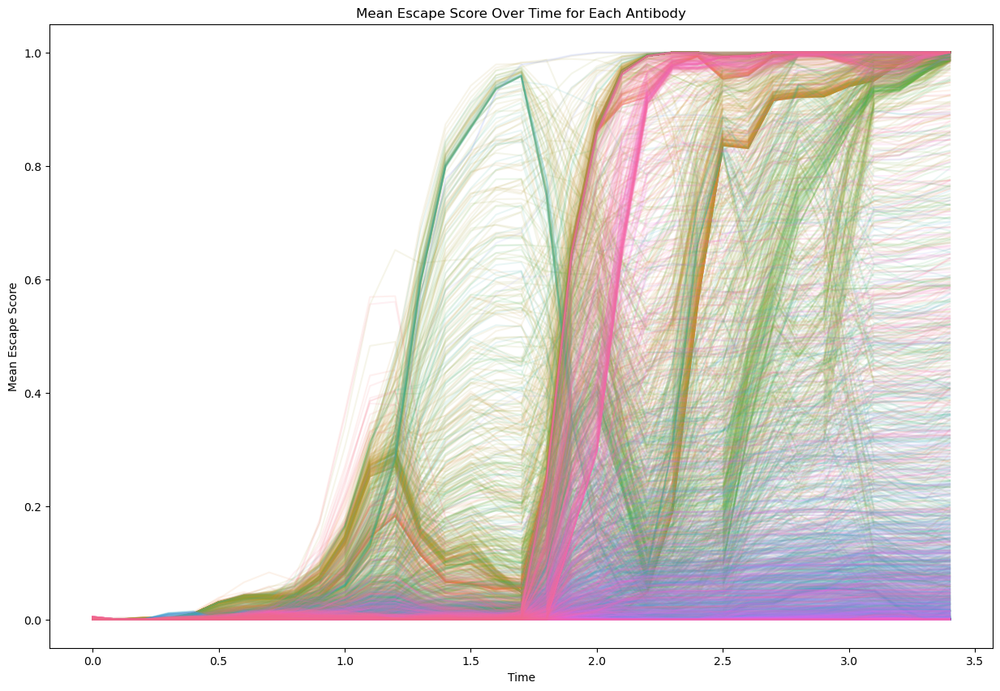

In [9]:
plt.figure(figsize=(15, 10))
sns.lineplot(data=ab_window_data, x='time', y='mean_escape', hue='antibody', legend=False, alpha=.1)

plt.title('Mean Escape Score Over Time for Each Antibody')
plt.xlabel('Time')
plt.ylabel('Mean Escape Score')
plt.show()

# Creating a distance matrix 
* This code will calculate the euclidian distance between each antibody
* That data will be stored in a matrix that is 2778 antibodies tall and 2778 antibodies wide, since this is a euclidian distance matrix


# To start, pivot the dataframe to have one row per antibody and one column per time point

In [10]:
pivot_df = ab_window_data.pivot(index=['antibody', 'ab_group'], columns= 'time', values='mean_escape').fillna(0)
#this is for ones with y that exceeds 0.2
#pivot_df = pivot_df.loc[(pivot_df.drop('antibody', axis=1) > 0.2).any(axis=1)]
pivot_df = pivot_df.loc[(pivot_df > 0.2).any(axis=1)]



# This function will be applied to each cell in the DataFrame
# def truncate_values(value):
#     if value > 0.7:
#         return 0.7
#     else:
#         return value

# Apply function to every cell in the DataFrame
#pivot_df = pivot_df.applymap(truncate_values)

pivot_df['average'] = pivot_df.iloc[:, 2:].mean(axis=1)

# Filter rows where the average is greater than 0.2
pivot_df = pivot_df[pivot_df['average'] > 0.2]
pivot_df = pivot_df.drop(columns='average')
pivot_df

,time,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,...,2.5,2.6,2.7,2.8,2.9,3.0,3.1,3.2,3.3,3.4
antibody,ab_group,,,,,,,,,,,,,,,,,,,,,
1-57,D1,0.000000,0.000048,0.000044,0.000000,0.000065,0.000153,0.000549,0.007980,0.006030,0.003625,...,0.168439,0.408546,0.394802,0.260410,0.361380,0.659968,0.914195,0.944013,0.953997,0.985401
2-15,C,0.000000,0.000000,0.000526,0.000620,0.010204,0.030480,0.042006,0.040987,0.039823,0.073481,...,0.992188,0.993243,1.000000,0.996797,0.997164,1.000000,1.000000,1.000000,1.000000,1.000000
7D6,C,0.000000,0.000000,0.000187,0.000221,0.010204,0.030120,0.039527,0.038966,0.039823,0.072562,...,0.992188,0.993243,1.000000,0.995370,0.995902,1.000000,1.000000,1.000000,1.000000,1.000000
ADG-2,F3,0.003703,0.000000,0.000000,0.000000,0.001356,0.005312,0.006344,0.009141,0.012349,0.016737,...,0.978372,0.969346,0.979395,0.994735,0.995339,0.985095,0.963330,0.966948,0.992215,1.000000
B38,A,0.000000,0.000000,0.000733,0.002324,0.005279,0.030257,0.036134,0.022555,0.036077,0.085145,...,0.989262,0.989620,0.998861,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XGv-409,B,0.000000,0.000286,0.000595,0.000392,0.000847,0.002563,0.005260,0.013019,0.008983,0.006001,...,0.861759,0.858525,0.930110,0.934200,0.934692,0.950441,0.959191,0.983863,1.000000,1.000000
XGv-412,E1,0.000000,0.000000,0.000000,0.000000,0.000000,0.002073,0.002476,0.000170,0.016819,0.021528,...,0.436296,0.606672,0.768609,0.877955,0.909540,0.938996,0.968903,0.961205,0.976767,0.994111
XGv-416,F2,0.002545,0.000000,0.000000,0.000000,0.000438,0.001294,0.001546,0.001524,0.001711,0.003049,...,0.992188,0.993243,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


This is the original distance matrix, with all of the values, but this is not the one that we currently use

In [11]:
# # This function calculates the Euclidean distance between two vectors (vec1 and vec2).
# # The distance is calculated as the square root of the sum of squared differences between corresponding elements of the vectors.
# def euclidean_distance(vec1, vec2):
#     return np.sqrt(np.sum((vec1 - vec2) ** 2))

# # Identify all unique antibodies in our dataset.
# antibodies = ab_window_data['antibody'].unique()

# # Create an empty dictionary called 'antibody_dict'.
# # This dictionary will store the trajectory of mean_escape values for each antibody.
# antibody_dict = {}
# # Loop through each unique antibody to populate the dictionary.
# for ab in antibodies:
#     # Filter the rows in ab_window_data where the antibody is the one we're looking at ('ab').
#     # Sort these rows based on the 'time' column.
#     # Extract the 'mean_escape' values into a NumPy array.
#     # Store this array in the 'antibody_dict' dictionary under the key named after the antibody.
#     traj = ab_window_data[ab_window_data['antibody'] == ab].sort_values(by='time')['mean_escape'].values
#     antibody_dict[ab] = traj

# # Create an empty DataFrame called 'distance_matrix'.
# # The row and column names are the unique antibodies.
# # This DataFrame will be used to store the Euclidean distances between each pair of antibodies.
# distance_matrix = pd.DataFrame(index=antibodies, columns=antibodies)

# # Start a nested loop to go through each pair of antibodies.
# # For each pair (ab1, ab2), we will calculate the Euclidean distance between their trajectories.
# for ab1 in antibodies:
#     for ab2 in antibodies:
#         # If the antibodies are the same, the distance is zero.
#         if ab1 == ab2:
#             distance_matrix.loc[ab1, ab2] = 0.0
#         else:
#             # If the antibodies are different, we fetch their trajectories from 'antibody_dict'.
#             traj1 = antibody_dict[ab1]
#             traj2 = antibody_dict[ab2]
            
#             # Assert to check the trajectories are the same length 
#             assert len(traj1) == len(traj2)
            
            
            
#             # Calculate the Euclidean distance between the two trajectories using our function from before.
#             # Store this distance value in the corresponding cell of the 'distance_matrix' DataFrame.
#             distance = euclidean_distance(traj1, traj2)
#             distance_matrix.loc[ab1, ab2] = distance

# #Now display the matrix         
# print(distance_matrix)


This is the new distance matrix, with truncated values, we truncated the values by having the maximum mean escape for any time point be 0.7, this helped with teh clustering

In [12]:
# # This function calculates the Euclidean distance between two vectors (vec1 and vec2).
# # The distance is calculated as the square root of the sum of squared differences between corresponding elements of the vectors.
# def euclidean_distance(vec1, vec2):
#     return np.sqrt(np.sum((vec1 - vec2) ** 2))
# ##**********************************************************
# ## TRUNCATING VALUES
# # This function will be applied to each cell in the 'mean_escape' column
# # def truncate_values(value):
# #     if value > 0.7:
# #         return 0.7
# #     else:
# #         return value

# # # Apply function to the 'mean_escape' column
# # ab_window_data['mean_escape'] = ab_window_data['mean_escape'].apply(truncate_values)


# ##******************************************************
# # Identify all unique antibodies in our dataset.
# antibodies = pivot_df.index.get_level_values('antibody').unique()


# # Create an empty dictionary called 'antibody_dict'.
# # This dictionary will store the trajectory of mean_escape values for each antibody.
# antibody_dict = {}
# # Loop through each unique antibody to populate the dictionary.
# for ab in antibodies:
#     # Filter the rows in ab_window_data where the antibody is the one we're looking at ('ab').
#     # Sort these rows based on the 'time' column.
#     # Extract the 'mean_escape' values into a NumPy array.
#     # Store this array in the 'antibody_dict' dictionary under the key named after the antibody.
#     traj = ab_window_data[ab_window_data['antibody'] == ab].sort_values(by='time')['mean_escape'].values
#     antibody_dict[ab] = traj

# # Create an empty DataFrame called 'distance_matrix'.
# # The row and column names are the unique antibodies.
# # This DataFrame will be used to store the Euclidean distances between each pair of antibodies.
# distance_matrix = pd.DataFrame(index=antibodies, columns=antibodies)

# # Start a nested loop to go through each pair of antibodies.
# # For each pair (ab1, ab2), we will calculate the Euclidean distance between their trajectories.
# for ab1 in antibodies:
#     for ab2 in antibodies:
#         # If the antibodies are the same, the distance is zero.
#         if ab1 == ab2:
#             distance_matrix.loc[ab1, ab2] = 0.0
#         else:
#             # If the antibodies are different, we fetch their trajectories from 'antibody_dict'.
#             traj1 = antibody_dict[ab1]
#             traj2 = antibody_dict[ab2]
            
#             # Assert to check the trajectories are the same length 
#             assert len(traj1) == len(traj2)
            
            
            
#             # Calculate the Euclidean distance between the two trajectories using our function from before.
#             # Store this distance value in the corresponding cell of the 'distance_matrix' DataFrame.
#             distance = euclidean_distance(traj1, traj2)
#             distance_matrix.loc[ab1, ab2] = distance

# #Now display the matrix         
# print(distance_matrix)

## Turn the Dataframe in to a CSV file for future use

In [13]:
#distance_matrix.to_csv('distance_matrix.csv')

# Now, lets display the UMAP analysis
* Note, this is not the final alaysis, we will do further analysis by clustering and coloring
* This will be done at the end of the Python Notebook so we can have all of the data we need to do so

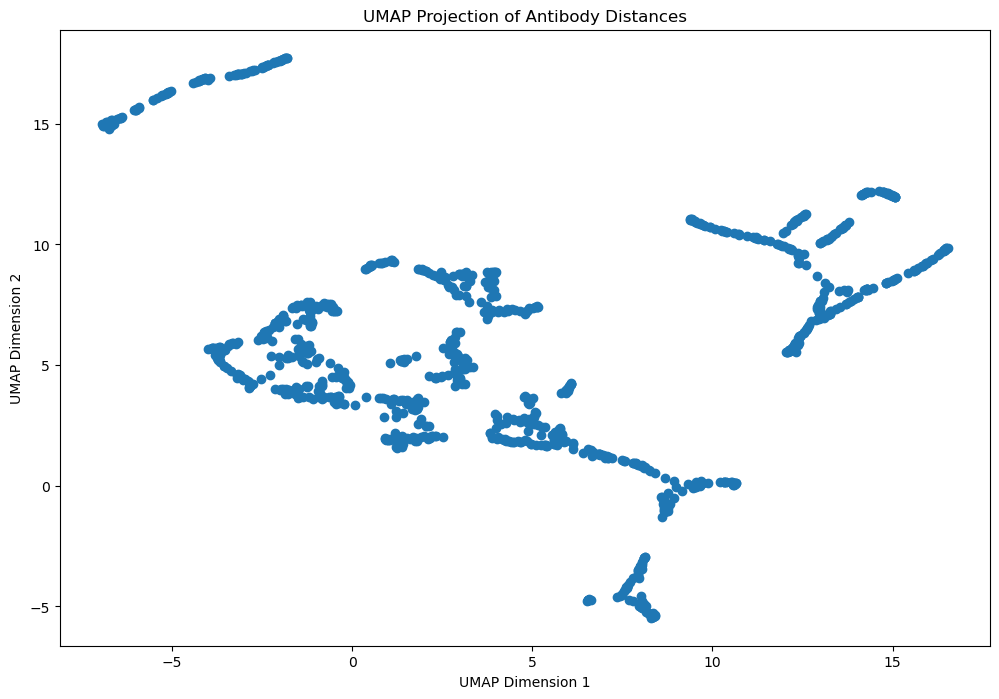

In [14]:
# Read the saved distance_matrix from the CSV file
distance_matrix = pd.read_csv('distance_matrix.csv', index_col=0)

# make sure the dataframe is of type float
distance_matrix = distance_matrix.astype(float)

# Create a UMAP model
umap_model = umap.UMAP(random_state=42)  # Using seed to get same results every time

# Fit the model to data 
embedding = umap_model.fit_transform(distance_matrix)

# Extract the 2D coordinates
x_coords = embedding[:, 0]
y_coords = embedding[:, 1]

# Create a scatter plot
plt.figure(figsize=(12, 8))
plt.scatter(x_coords, y_coords)


plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP Projection of Antibody Distances')

plt.show()

## K-Means Clustering on Antibody Escape Data Over Time

Now, we'll walk through the following steps:

1. **Data Pivoting**: Reshaping the dataset to set each antibody as a row and time points as columns.
2. **Optimal Cluster Determination**: Using the Elbow method to deduce the best cluster count for K-Means.
3. **K-Means Clustering**: Applying K-Means based on the optimal or pre-defined cluster count.
4. **Visualization**: Plotting the resulting clusters to observe antibody behavior over time.


# To start, pivot the dataframe to have one row per antibody and one column per time point

### Determining the Optimal Number of Clusters
Here, we're employing the Elbow method. This visual technique helps find the number of clusters where the rate of reduction in distortion slows down, suggesting an optimal cluster count.


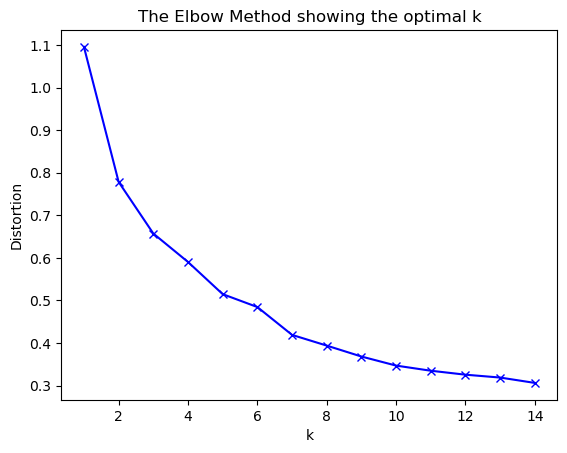

In [15]:
# Compute optimal number of clusters using Elbow method
distortions = []
K = range(1,15) # This range can be adjusted depending on use case
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0)
    kmeanModel.fit(pivot_df)
    distortions.append(sum(np.min(cdist(pivot_df, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / pivot_df.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()


## Interpretation of the Plot

* The "elbow" is observed to occur within the 2-4k range, suggesting that 2-4 is the optimal number of clusters.
* For this analysis, we've chosen 12 clusters. The rationale behind this choice will be shown in the upcoming cells.


### K-Means Clustering Application
After deducing or choosing the number of clusters, we proceed to segment the data using K-Means.


In [16]:
# Pick the optimal number of clusters by examining the elbow plot
n_clusters = 9 # change this based on your elbow plot result

#NOTE: we chose a large K value due to the large dataset we used

# Perform k-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=0, max_iter = 8000).fit(pivot_df)

# Add the cluster labels back into the pivot dataframe
pivot_df['cluster'] = kmeans.labels_

### Visualizing Clustering Results
For each identified cluster, we visualize antibodies over time. This allows us to observe patterns and compare the behavior of different antibodies and antibody groups.


First we will make a dataframe that will be able to hold the average trajecotries that will be portrayed in each cluster:

In [17]:
mean_trajectory_df = pd.DataFrame(columns=['cluster', 'time', 'mean_value'])

Now lets plot the clusters and record the mean trajecotory data in our new data frame

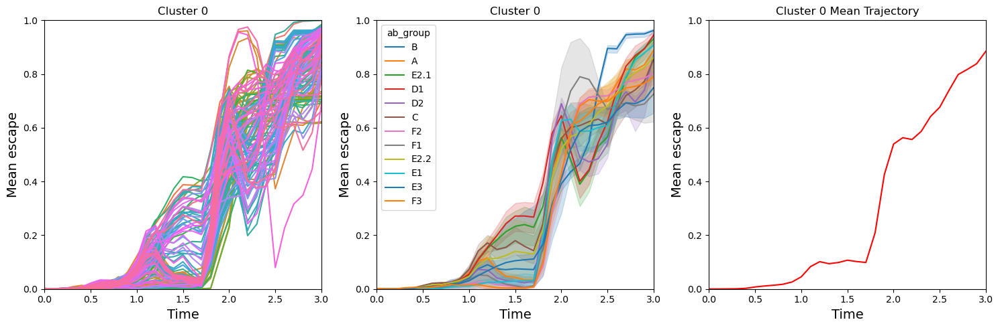

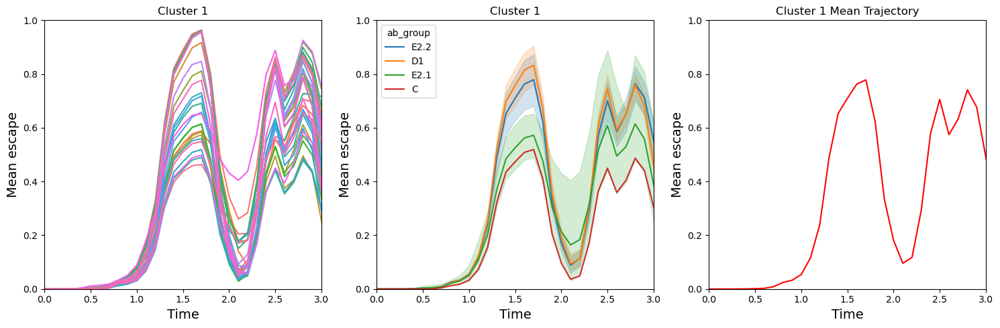

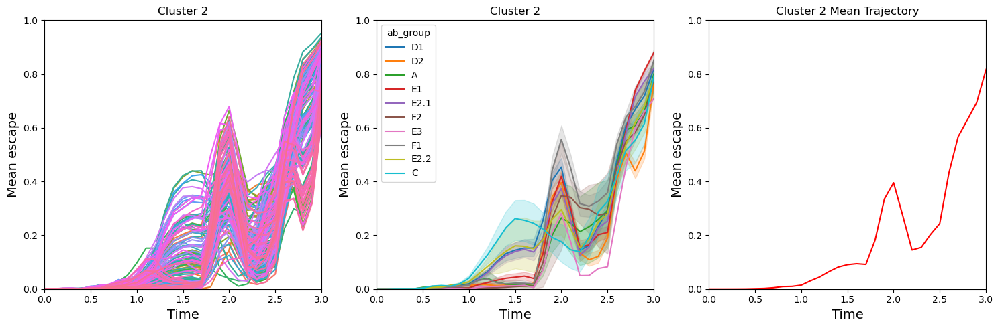

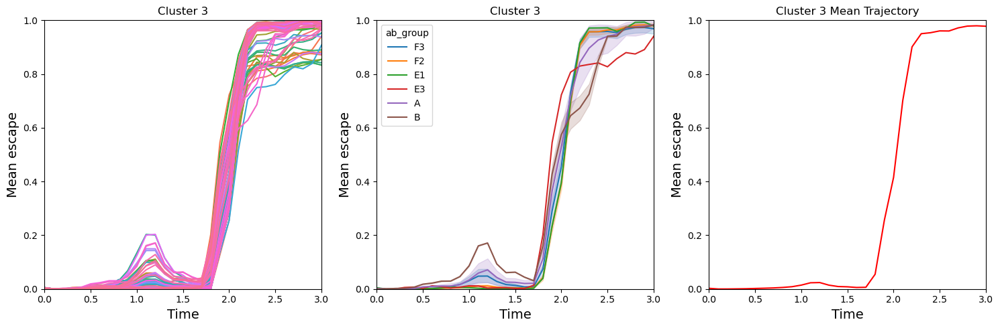

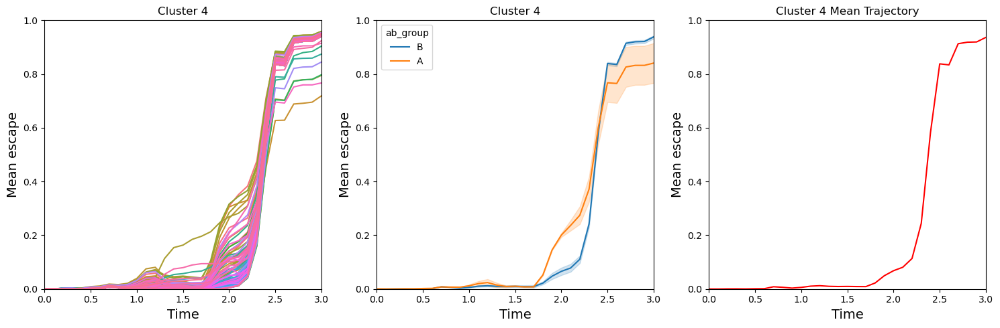

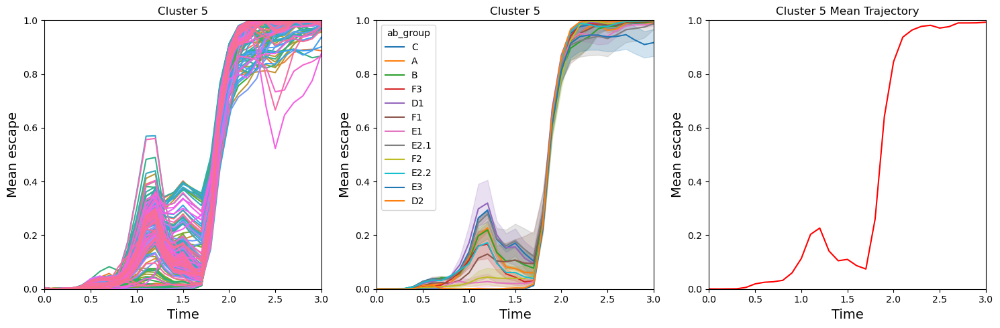

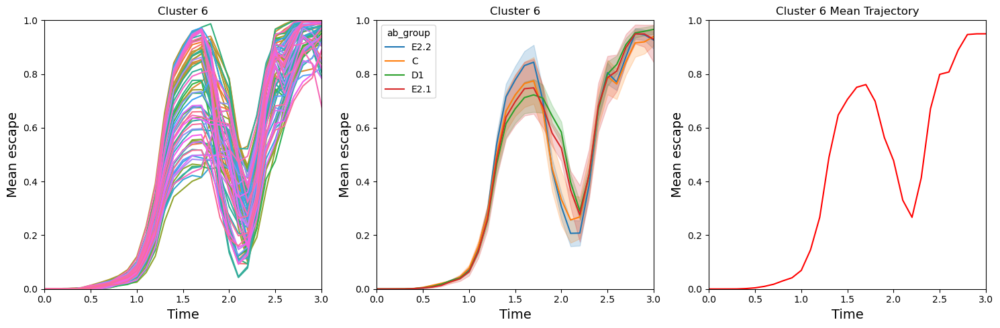

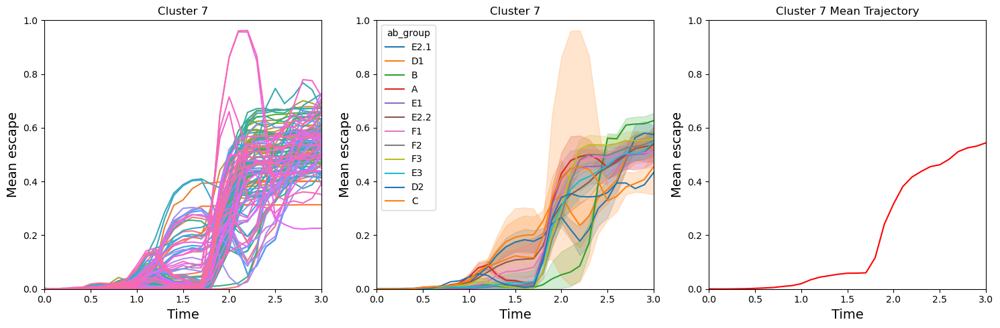

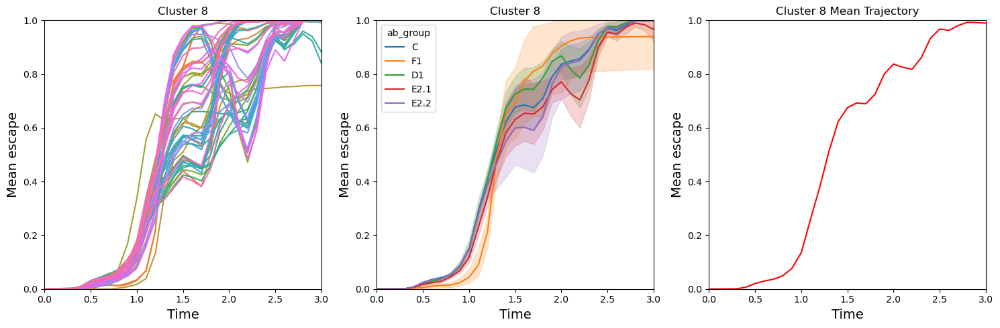

In [18]:
# Initialize an empty DataFrame for storing mean trajectory data
mean_trajectory_df = pd.DataFrame()

# Initialize a dictionary to hold the count of antibodies in each cluster
antibody_count_per_cluster = {}

# DataFrame to store the antibody-cluster mapping
antibody_cluster_df = pd.DataFrame(columns=['Cluster', 'Antibody'])  # New Line

# Assuming 'n_clusters' and 'pivot_df' are already defined
for cluster in range(n_clusters):
    cluster_df = pivot_df[pivot_df['cluster'] == cluster].drop(columns='cluster').reset_index()
    cluster_df = cluster_df.melt(id_vars=['ab_group', 'antibody'])
    cluster_df.time = cluster_df.time.astype(float)
    
    # Count the number of unique antibodies in this cluster and update the dictionary
    num_antibodies = cluster_df['antibody'].nunique()
    antibody_count_per_cluster[cluster] = num_antibodies
    
    # Get the unique antibodies in this cluster
    unique_antibodies = cluster_df['antibody'].unique()  
    
    # Create a DataFrame mapping each unique antibody to this cluster
    temp_df = pd.DataFrame({'Cluster': [cluster]*len(unique_antibodies), 'Antibody': unique_antibodies})  # New Line
    
    # Append this mapping to antibody_cluster_df
    antibody_cluster_df = pd.concat([antibody_cluster_df, temp_df], ignore_index=True)  # New Line
    
    # Calculate mean trajectory for this cluster
    mean_trajectory = cluster_df.groupby('time')['value'].mean().reset_index()
    mean_trajectory['cluster'] = cluster
    
    # Append the mean trajectory to the DataFrame
    mean_trajectory_df = pd.concat([mean_trajectory_df, mean_trajectory.rename(columns={'value': 'mean_value'})])
    
    # Start subplots
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    # Normal plot with all antibodies in the cluster
    sns.lineplot(data=cluster_df, x='time', y='value', hue='antibody', ax=axs[0], legend=False)
    axs[0].set_title(f'Cluster {cluster}')
    axs[0].set_xlabel('Time', fontsize=14)
    axs[0].set_ylabel('Mean escape', fontsize=14)
    
    # Plot classified by antibody group
    sns.lineplot(data=cluster_df, x='time', y='value', hue='ab_group', palette='tab10', ax=axs[1])
    axs[1].set_title(f'Cluster {cluster}')
    axs[1].set_xlabel('Time', fontsize=14)
    axs[1].set_ylabel('Mean escape', fontsize=14)
    
    # Plot displaying mean trajectory
    sns.lineplot(data=cluster_df, x='time', y='value', ci=None, estimator=np.mean, color='r', ax=axs[2])
    axs[2].set_title(f'Cluster {cluster} Mean Trajectory')
    axs[2].set_xlabel('Time', fontsize=14)
    axs[2].set_ylabel('Mean escape', fontsize=14)
    
    # set x and y axis limits
    axs[0].set_xlim([0, 3])
    axs[0].set_ylim([0, 1])
    axs[1].set_xlim([0, 3])
    axs[1].set_ylim([0, 1])
    axs[2].set_xlim([0, 3])
    axs[2].set_ylim([0, 1])
    
    # Show the plot
    plt.tight_layout()
    plt.show()



### Now, we turn the antibody_cluster_df dataframe which contains each antibody in a column, and each corresponding cluster for that antibody in another column, into a csv file for use in the umap analysis

In [19]:
antibody_cluster_df.to_csv('antibody_cluster_df.csv')

Now, using the mean trajctory Data Frame we created above and the data we filled it with from each cluster iteration, lets plot all the trajectories and see how they compare using a seaborne function called relplot:

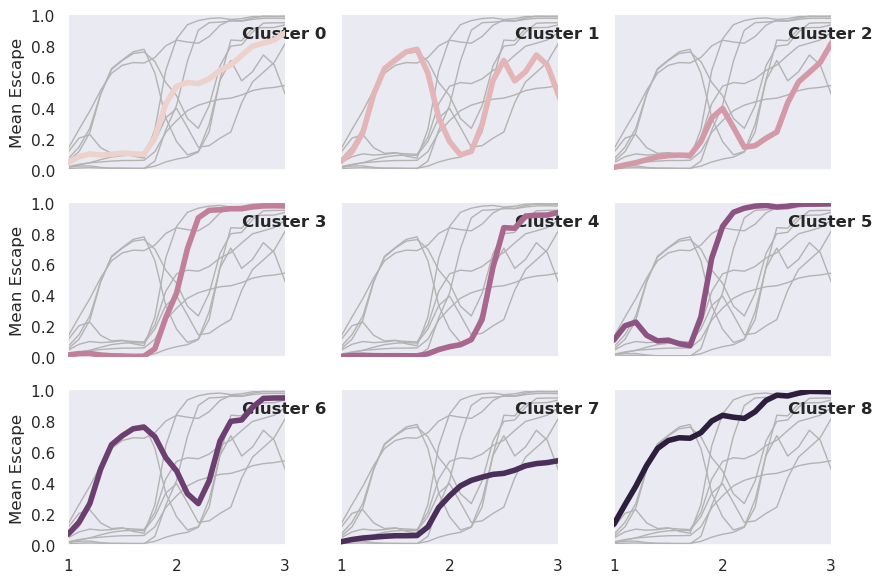

In [20]:
#Inspiration for this code came from https://seaborn.pydata.org/examples/timeseries_facets.html

# Set theme
sns.set_theme(style="dark")

# Create the relplot
g = sns.relplot(
    data=mean_trajectory_df,
    x="time", y="mean_value", col="cluster", hue="cluster",
    kind="line", linewidth=4, zorder=5,
    col_wrap=3, height=2, aspect=1.5, legend=False,
)

# Iterate over each subplot to customize further
for cluster, ax in g.axes_dict.items():

    # Add the title as an annotation within the plot
    ax.text(.8, .85, f"Cluster {cluster}", transform=ax.transAxes, fontweight="bold")

    # Plot all clusters' time series in the background (this is optional)
    sns.lineplot(
        data=mean_trajectory_df, x="time", y="mean_value", units="cluster",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )
    
    # Set x and y axis limits for each subplot
    ax.set_xlim([1, 3])
    ax.set_ylim([0, 1])
    
# make the ticks less
ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("", "Mean Escape")
g.tight_layout()

plt.show()


# Lets dive into the UMAP analysis now

Here, lets color the dots on teh UMAP analysis based on antibody groups

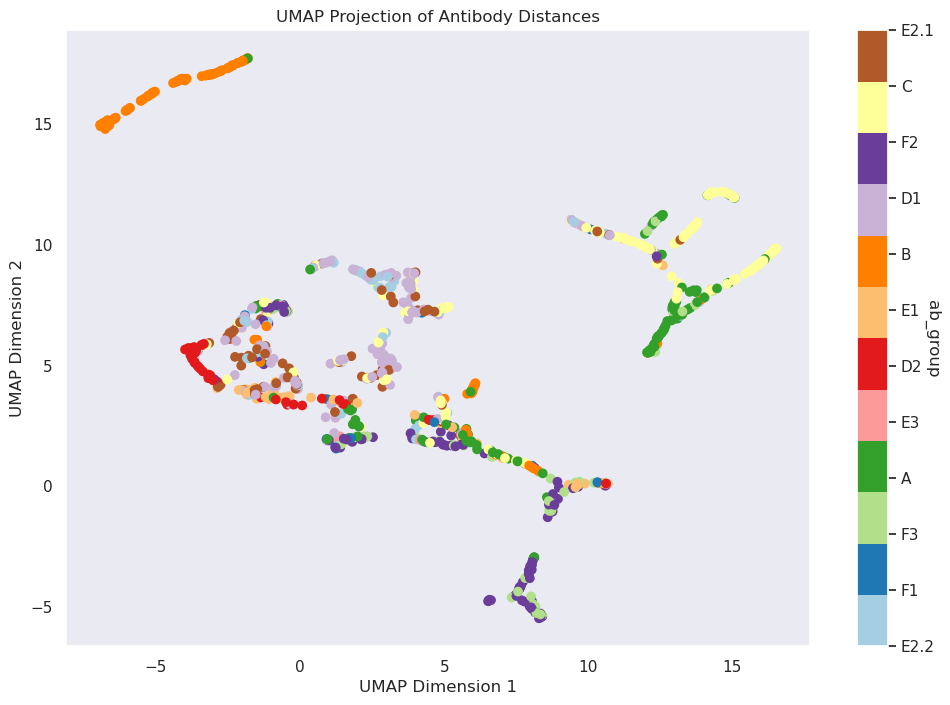

In [21]:
# Here, we are reading the 'distance_matrix.csv' file into a DataFrame.
# The 'index_col=0' argument tells pandas to use the first column of the CSV as the row labels (index) for the DataFrame.
distance_matrix = pd.read_csv('distance_matrix.csv', index_col=0)

# Ensuring that the entire DataFrame consists of floating point numbers. This is important for math operations
# and compatibility with many algorithms like UMAP.
distance_matrix = distance_matrix.astype(float)

# Create a dictionary that maps each antibody to its respective 'ab_group'. This will be useful for coloring the points 
# in our scatter plot later on. The 'zip' function pairs up elements from two lists into tuples.
ab_to_group_dict = dict(zip(ab_window_data['antibody'], ab_window_data['ab_group']))

# Now, we map the antibodies in the 'distance_matrix' to their corresponding 'ab_group' using the dictionary created above.
# If an antibody isn't found in our dictionary, it's labeled as 'Unknown'.
colors = [ab_to_group_dict.get(ab, 'Unknown') for ab in distance_matrix.index]

# Extract the unique 'ab_group' labels. We'll use these for creating a color palette for our scatter plot.
unique_ab_groups = list(set(colors))

# Create a dictionary that maps each 'ab_group' to a unique index. This index will correspond to a color 
# when plotting.
color_map = {ab_group: idx for idx, ab_group in enumerate(unique_ab_groups)}

# Map each antibody in the 'colors' list to its respective color index.
colors = [color_map[ab_group] for ab_group in colors]

# Initialize a UMAP model. The 'metric=precomputed' argument is essential because we're using a precomputed distance matrix.
umap_model = umap.UMAP(random_state=42)

# Fit the UMAP model to the distance matrix and get the reduced dimensional representation. In this case, 
# the high-dimensional data gets transformed into 2D coordinates.
embedding = umap_model.fit_transform(distance_matrix)

# Split the 2D coordinates into x and y for plotting.
x_coords = embedding[:, 0]
y_coords = embedding[:, 1]

# Set up a figure with a specific size for our scatter plot.
plt.figure(figsize=(12, 8))

# Create the scatter plot. Each point's color is determined by its 'ab_group'. The 'cmap' argument specifies 
# a colormap which is a range of colors used in the plot.
sc = plt.scatter(x_coords, y_coords, c=colors, cmap=plt.cm.get_cmap('Paired', len(unique_ab_groups)))

# Add a color bar to the plot that shows the color corresponding to each 'ab_group'.
cbar = plt.colorbar(sc, ticks=range(len(unique_ab_groups)))
cbar.set_label('ab_group', rotation=270)  # Set the label for the color bar.
cbar.set_ticklabels(unique_ab_groups)  # Label each tick in the color bar with the 'ab_group' name.

# Label the x and y axes, and set a title for the scatter plot.
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP Projection of Antibody Distances')

# Display the scatter plot.

plt.show()

Lets extract some of the data from the Umap analysis, like the points and their x and y coordinates, and which antibody it is

In [22]:
# Create a new DataFrame from the embedding. This DataFrame will have the x and y coordinates.
embedding_df = pd.DataFrame(embedding, columns=['UMAP Dimension 1', 'UMAP Dimension 2'])

# Now, add the antibody names from the original distance matrix. We assume here that the index of 'distance_matrix'
# contains the antibody names, as suggested by your code for creating the 'colors' list.
embedding_df['antibody'] = distance_matrix.index
print(embedding_df)
# At this point, 'embedding_df' is a DataFrame where each row contains the UMAP coordinates for an antibody, along with
# the name of the antibody. You can use this for a labeled scatter plot, for example.
# Filter the DataFrame to only include rows where 'UMAP Dimension 1' > 10 and 'UMAP Dimension 2' > 7.
filtered_df = embedding_df[(embedding_df['UMAP Dimension 1'] < -6) & (embedding_df['UMAP Dimension 2'] > 2)]

# Extract the 'antibody' column from the filtered DataFrame. This column contains the names of the antibodies

antibodies_list = filtered_df['antibody'].tolist()
embedding_df.head()

      UMAP Dimension 1  UMAP Dimension 2 antibody
0            -3.710562          5.198336     1-57
1            14.623349         12.211236     2-15
2            16.524082          9.862560      7D6
3             8.654818         -1.040879    ADG-2
4            14.130311         12.059949      B38
...                ...               ...      ...
1137         -1.986859         17.630760  XGv-409
1138          1.984520          3.455150  XGv-412
1139          8.820475         -0.769615  XGv-416
1140         -1.540417          3.799418  XGv-420
1141          9.646855          0.105322  XGv-421

[1142 rows x 3 columns]


,UMAP Dimension 1,UMAP Dimension 2,antibody
0,-3.710562,5.198336,1-57
1,14.623349,12.211236,2-15
2,16.524082,9.862560,7D6
3,8.654818,-1.040879,ADG-2
4,14.130311,12.059949,B38


Lets save this info in a dataframe

In [23]:
embedding_df.to_csv('embedding_df')
filtered_df.to_csv('filtered_df.csv')

Now lets show the UMAP, colored by cluster from the k means clusteriung done previously.

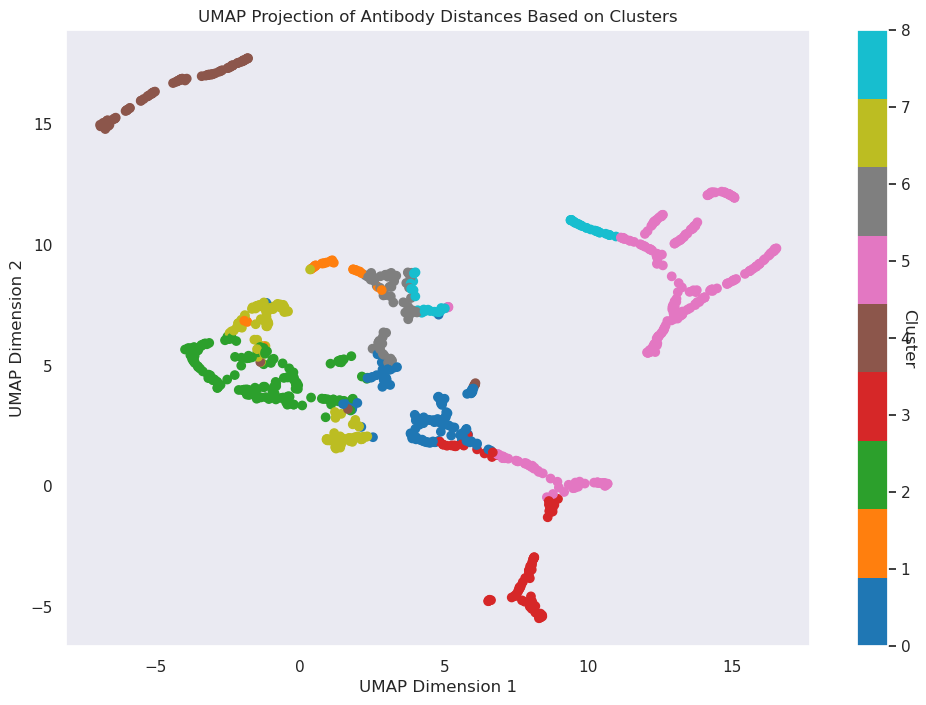

In [24]:
# Here, we read the 'distance_matrix.csv' file into a DataFrame.
# The 'index_col=0' argument tells pandas to use the first column of the CSV as the row labels (index) for the DataFrame.
distance_matrix = pd.read_csv('distance_matrix.csv', index_col=0)

# We're also reading another dataset 'antibody_cluster_df.csv' which contains information about the cluster
# each antibody belongs to.
antibody_cluster_df = pd.read_csv('antibody_cluster_df.csv')

# Ensuring that the distance matrix consists of floating point numbers, making it compatible for mathematical operations
# and many algorithms like UMAP.
distance_matrix = distance_matrix.astype(float)

# Creating a dictionary that maps each antibody name to its respective cluster. 
# The 'zip' function pairs up elements from two columns of the dataframe into tuples.
ab_to_cluster_dict = dict(zip(antibody_cluster_df['Antibody'], antibody_cluster_df['Cluster']))

# Now, we associate the antibodies in the 'distance_matrix' with their respective cluster using the above dictionary.
# If an antibody is not found in our dictionary, it gets labeled as 'Unknown'.
colors = [ab_to_cluster_dict.get(ab, 'Unknown') for ab in distance_matrix.index]

# Extract the unique cluster labels. These will be used for creating a color palette for our scatter plot.
unique_clusters = list(set(colors))

# Create a dictionary that associates each unique cluster to a unique color index. 
# This index will correspond to a color when plotting.
color_map = {cluster: idx for idx, cluster in enumerate(unique_clusters)}

# Assign a color index to each antibody based on its cluster.
colors = [color_map[cluster] for cluster in colors]

# Initialize the UMAP model.
umap_model = umap.UMAP(random_state=42)

# Apply the UMAP model to the distance matrix and reduce its dimensions.
# The result is a 2D representation of our data.
embedding = umap_model.fit_transform(distance_matrix)

# Extract the x and y coordinates from the 2D representation for plotting purposes.
x_coords = embedding[:, 0]
y_coords = embedding[:, 1]

# Set up the plotting canvas with specified dimensions.
plt.figure(figsize=(12, 8))

# Plot the 2D representation. The color of each point corresponds to its cluster.
sc = plt.scatter(x_coords, y_coords, c=colors, cmap=plt.cm.get_cmap('tab10', len(unique_clusters)))

# Add a color bar to the plot indicating which color corresponds to which cluster.
cbar = plt.colorbar(sc, ticks=range(len(unique_clusters)))
cbar.set_label('Cluster', rotation=270)
cbar.set_ticklabels(unique_clusters)

# Label the axes and give the plot a title.
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('UMAP Projection of Antibody Distances Based on Clusters')

# Display the scatter plot.
plt.show()

lets read in the points from teh UMAP, that we stored in a csv file previously, for more clustering

In [25]:
embedding_df = pd.read_csv('embedding_df')

Lets cluster the points of hte UMAP using the HDBSCAN algorithemn 

In [26]:
import hdbscan

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=12,  # Try lowering this to include smaller clusters
    min_samples=2,       # Try decreasing this to make it easier for points to be considered core points
    cluster_selection_epsilon=0.1,  # Try increasing this to merge close clusters
    
)

embedding_df['cluster'] = clusterer.fit_predict(embedding_df[['UMAP Dimension 1', 'UMAP Dimension 2']])


# Show the tail of the DataFrame to see the assigned clusters
embedding_df.tail()

,Unnamed: 0,UMAP Dimension 1,UMAP Dimension 2,antibody,cluster
1137,1137,-1.986859,17.630760,XGv-409,6
1138,1138,1.984520,3.455150,XGv-412,32
1139,1139,8.820475,-0.769615,XGv-416,10
1140,1140,-1.540417,3.799418,XGv-420,35
1141,1141,9.646855,0.105322,XGv-421,18


Now lets plot 

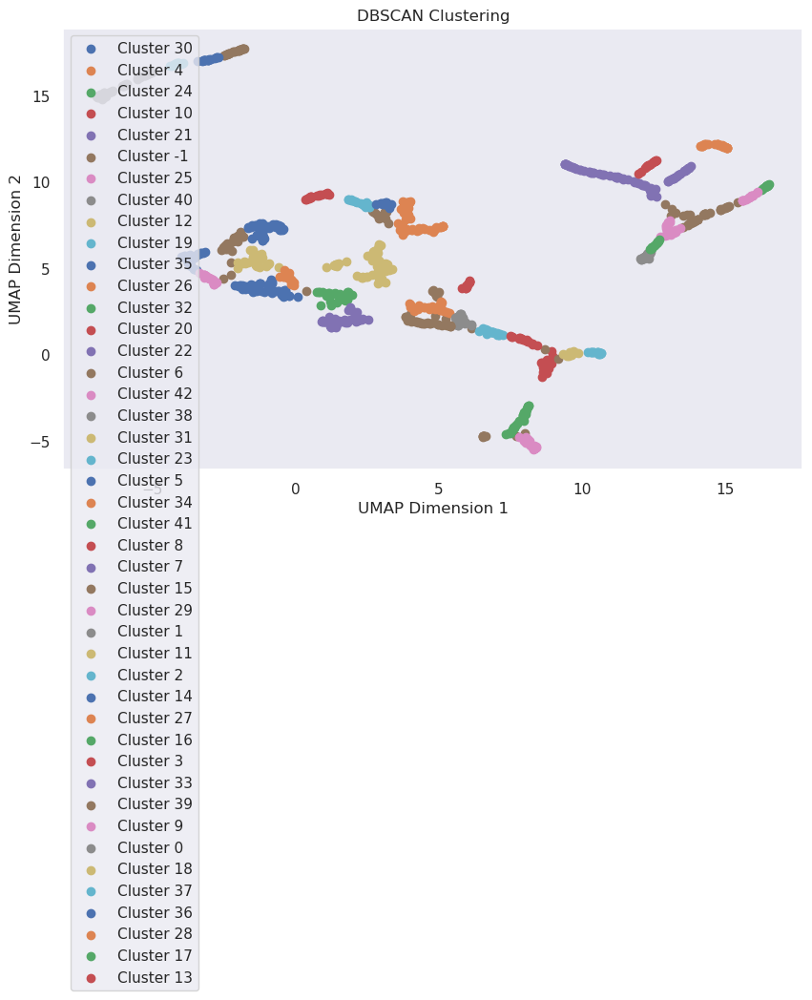

In [27]:
import matplotlib.pyplot as plt

# Sample data and DBSCAN clustering from the previous code
# Using the same embedding_df DataFrame

# Plotting the clusters
plt.figure(figsize=(10, 6))

# Unique cluster labels
unique_clusters = embedding_df['cluster'].unique()

# Plot each cluster with a different color
for cluster in unique_clusters:
    # Select data for each cluster
    cluster_data = embedding_df[embedding_df['cluster'] == cluster]
    
    # Plot the points with different colors
    plt.scatter(cluster_data['UMAP Dimension 1'], cluster_data['UMAP Dimension 2'], label=f'Cluster {cluster}')

plt.title('DBSCAN Clustering')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend()
plt.show()

Now, lets graph the trajecotries for the antibodies over time for all of the clusters in this UMAP

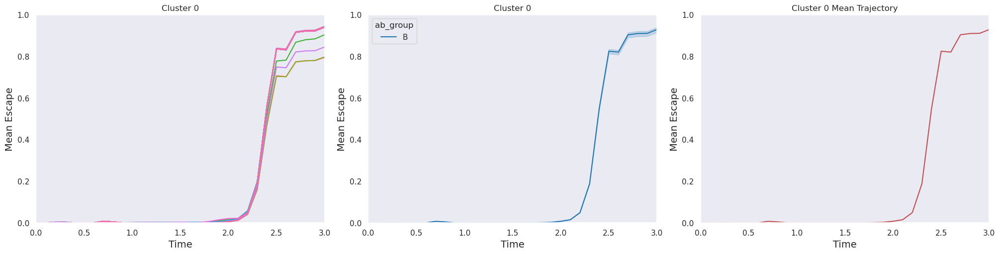

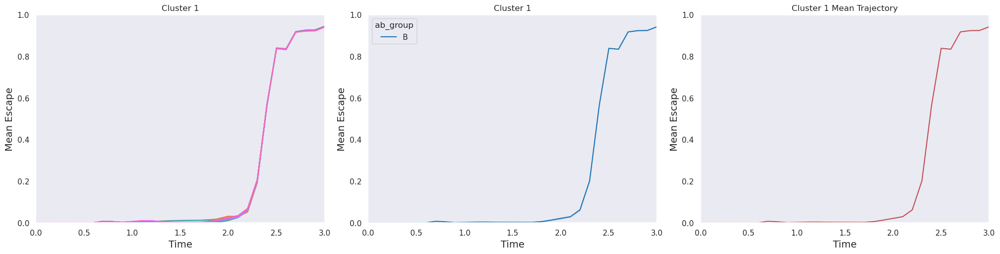

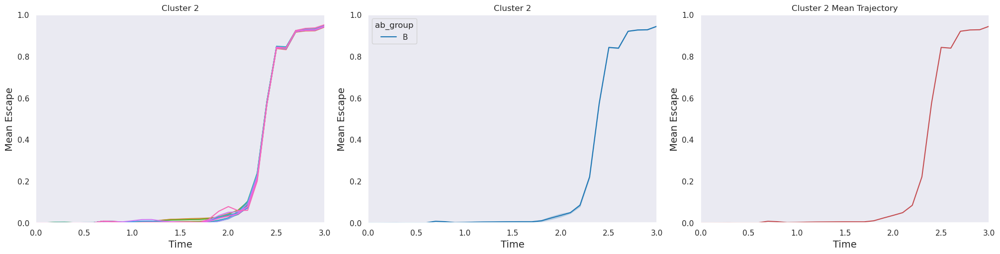

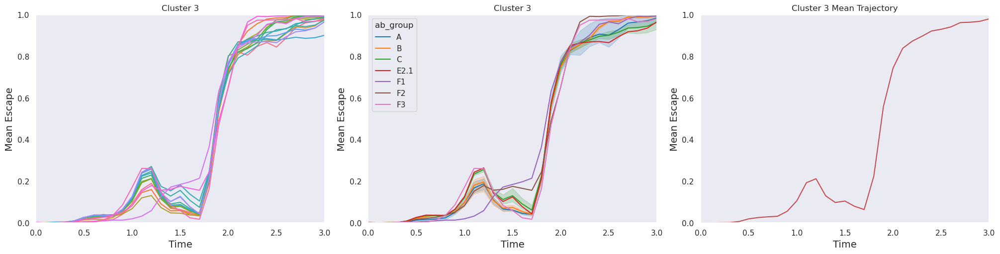

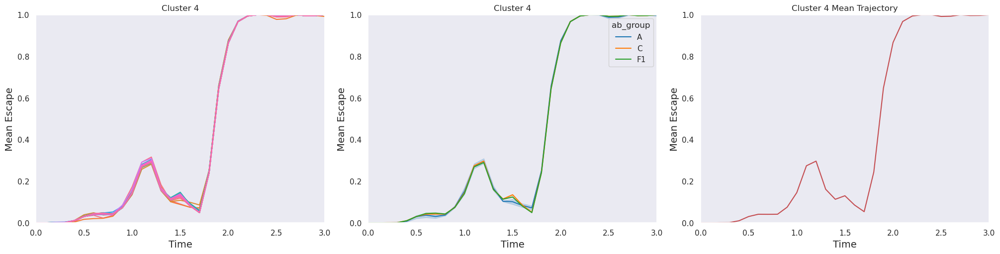

...

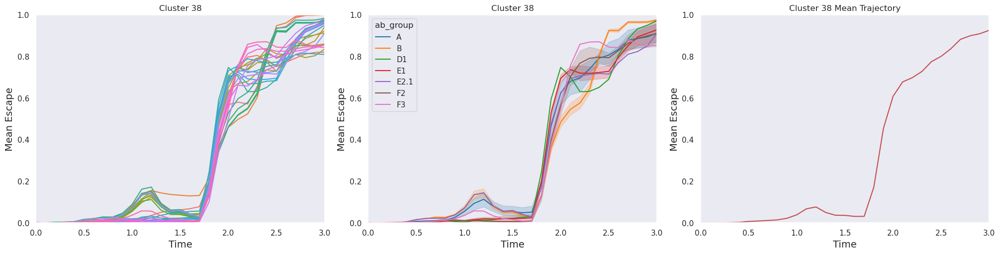

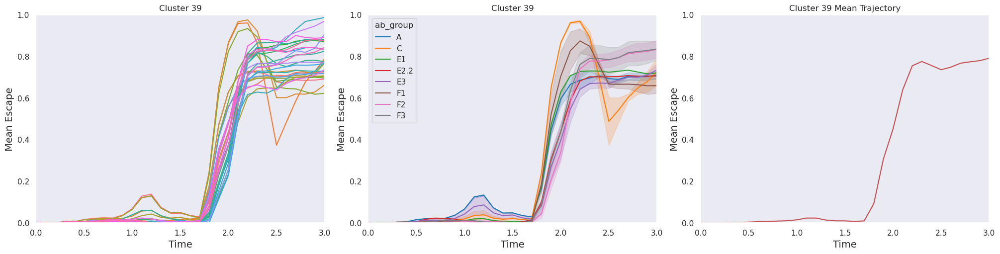

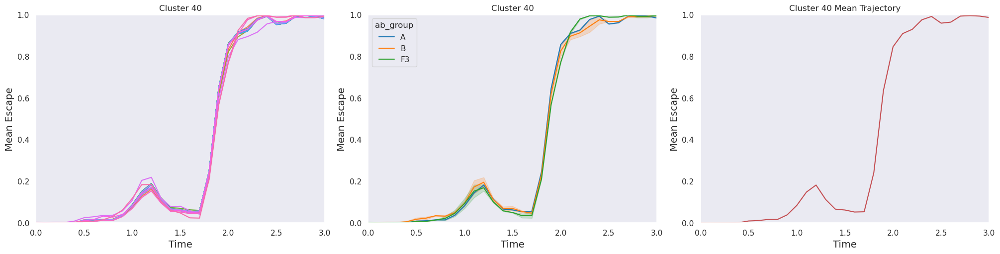

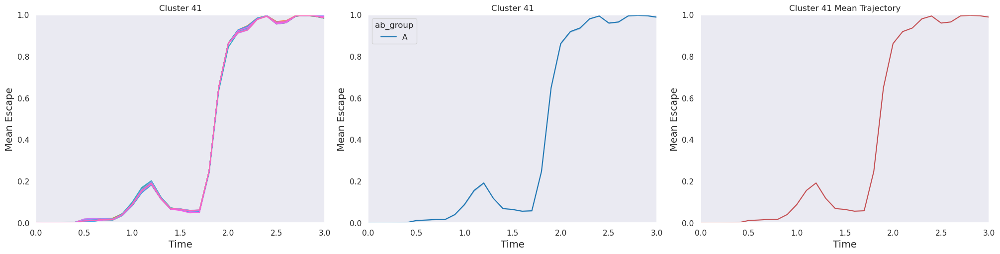

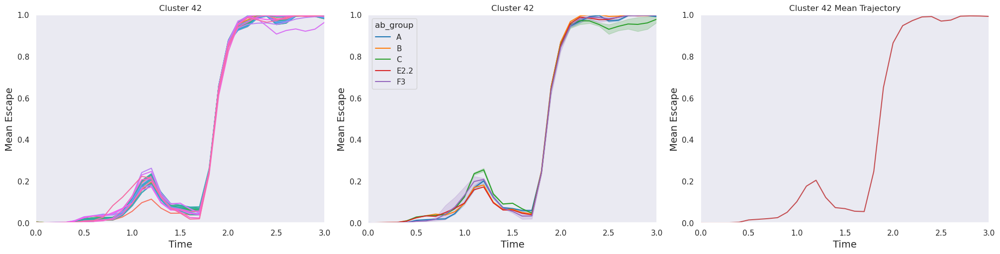

In [42]:
merged_data = pd.merge(ab_window_data, embedding_df, on='antibody')


# Define the number of clusters
num_clusters =embedding_df['cluster'].max() + 1


for cluster in range(num_clusters):
    # Filter the data for the current cluster
    cluster_df = merged_data[merged_data['cluster'] == cluster]

    if not cluster_df.empty:
        # Initialize a grid of 3 horizontal plots
        fig, axs = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)
        
        # Normal plot with all antibodies in the cluster
        sns.lineplot(data=cluster_df, x='time', y='mean_escape', hue='antibody', ax=axs[0], legend=False)
        axs[0].set_title(f'Cluster {cluster}')
        axs[0].set_xlabel('Time', fontsize=14)
        axs[0].set_ylabel('Mean Escape', fontsize=14)

        # Plot classified by antibody group
        sns.lineplot(data=cluster_df, x='time', y='mean_escape', hue='ab_group', palette='tab10', ax=axs[1])
        axs[1].set_title(f'Cluster {cluster}')
        axs[1].set_xlabel('Time', fontsize=14)
        axs[1].set_ylabel('Mean Escape', fontsize=14)

        # Plot displaying mean trajectory
        sns.lineplot(data=cluster_df, x='time', y='mean_escape', ci=None, estimator=np.mean, color='r', ax=axs[2])
        axs[2].set_title(f'Cluster {cluster} Mean Trajectory')
        axs[2].set_xlabel('Time', fontsize=14)
        axs[2].set_ylabel('Mean Escape', fontsize=14)
        
        # set x and y axis limits (adjust according to your specific data range)
        for ax in axs:
            ax.set_xlim([0, 3])  
            ax.set_ylim([0, 1])  
        
        # Show the plot
        plt.show()
        

Now, lets clean up the clusters 

In [105]:
#
merged_data['cluster'] = merged_data['cluster'].replace(4, 3)
merged_data['cluster'] = merged_data['cluster'].replace(7, 3)
#
merged_data['cluster'] = merged_data['cluster'].replace(17, 10)
merged_data['cluster'] = merged_data['cluster'].replace(18, 10)
merged_data['cluster'] = merged_data['cluster'].replace(19, 10)
# 
merged_data['cluster'] = merged_data['cluster'].replace(1, 0)
merged_data['cluster'] = merged_data['cluster'].replace(2, 0)
merged_data['cluster'] = merged_data['cluster'].replace(5, 0)
merged_data['cluster'] = merged_data['cluster'].replace(6, 0)
#
merged_data['cluster'] = merged_data['cluster'].replace(30, 29)
merged_data['cluster'] = merged_data['cluster'].replace(34, 29)
merged_data['cluster'] = merged_data['cluster'].replace(35, 29)
#
merged_data['cluster'] = merged_data['cluster'].replace(10, 9)
merged_data['cluster'] = merged_data['cluster'].replace(16, 9)
#
merged_data['cluster'] = merged_data['cluster'].replace(20, 3)
merged_data['cluster'] = merged_data['cluster'].replace(24, 3)
merged_data['cluster'] = merged_data['cluster'].replace(40, 3)
#
merged_data['cluster'] = merged_data['cluster'].replace(25, 24)
#
merged_data['cluster'] = merged_data['cluster'].replace(11, 12)
#
merged_data['cluster'] = merged_data['cluster'].replace(36, 13)
#
merged_data['cluster'] = merged_data['cluster'].replace(22, 21)
# 
merged_data['cluster'] = merged_data['cluster'].replace(37, 36)
#
merged_data['cluster'] = merged_data['cluster'].replace(41, 40)
merged_data['cluster'] = merged_data['cluster'].replace(42, 40)

#
merged_data['cluster'] = merged_data['cluster'].replace(32, 29)
#
merged_data['cluster'] = merged_data['cluster'].replace(33, 14)
#
merged_data['cluster'] = merged_data['cluster'].replace(38, 8)
#
merged_data['cluster'] = merged_data['cluster'].replace(23, 3)

#
merged_data['cluster'] = merged_data['cluster'].replace(31, 100)
#
merged_data['cluster'] = merged_data['cluster'].replace(27, 200)
#
merged_data['cluster'] = merged_data['cluster'].replace(15, 300)


# #merging cluter 20 with 21
# merged_data['cluster'] = merged_data['cluster'].replace(20, 21)
# Looping over each row and updating the 'cluster' value if the condition is met
for index, row in merged_data.iterrows():
    if row['cluster'] == 13 and row['ab_group'] == 'A':
        merged_data.at[index, 'cluster'] = None
# Looping over each row and updating the 'cluster' value if the condition is met
for index, row in merged_data.iterrows():
    if row['cluster'] == 14 and row['ab_group'] == 'C' or row['cluster'] == 14 and row['ab_group'] == 'D1':
        merged_data.at[index, 'cluster'] = None
# Looping over each row and updating the 'cluster' value if the condition is met
for index, row in merged_data.iterrows():
    if row['cluster'] == 15 and row['ab_group'] == 'F1':
        merged_data.at[index, 'cluster'] = None
# Looping over each row and updating the 'cluster' value if the condition is met
for index, row in merged_data.iterrows():
    if row['cluster'] == 12 and row['ab_group'] == 'E3':
        merged_data.at[index, 'cluster'] = None
# Looping over each row and updating the 'cluster' value if the condition is met
for index, row in merged_data.iterrows():
    if row['cluster'] == 39 and row['ab_group'] == 'C' or row['cluster'] == 39 and row['ab_group'] == 'F1':
        merged_data.at[index, 'cluster'] = None

Lets graph the results 

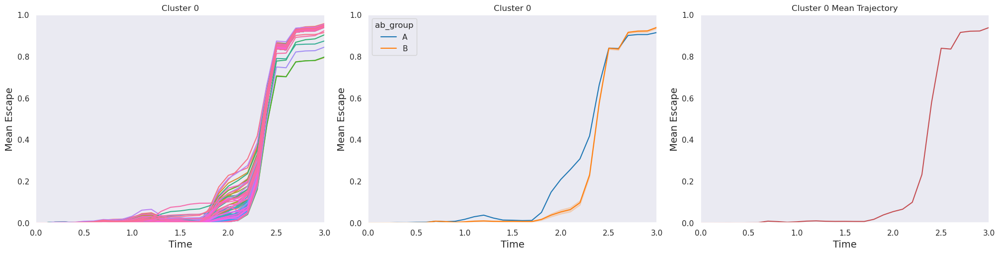

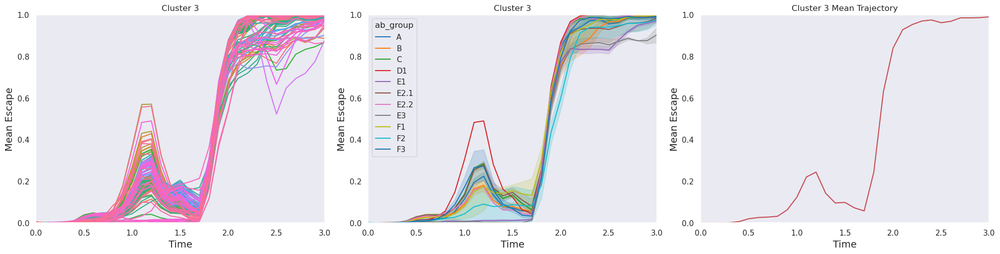

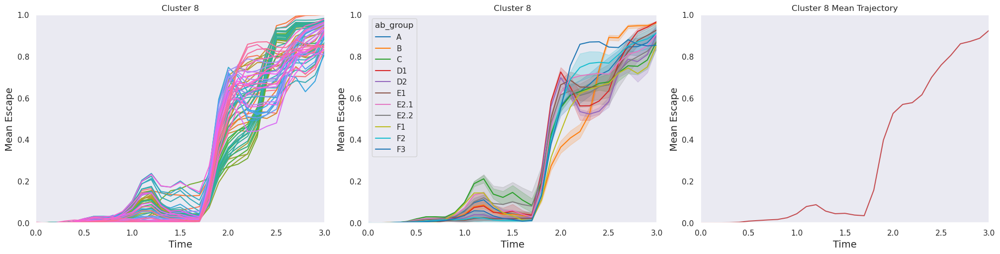

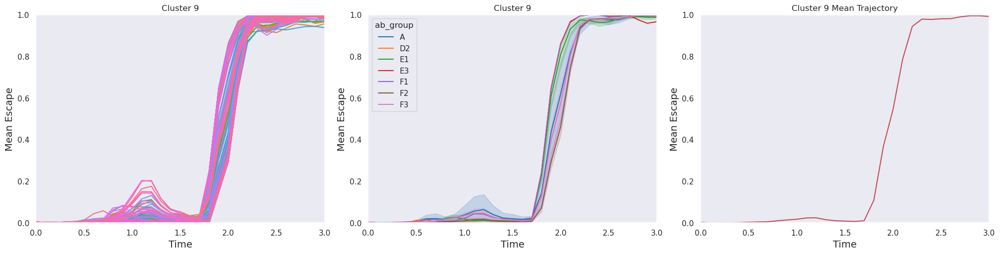

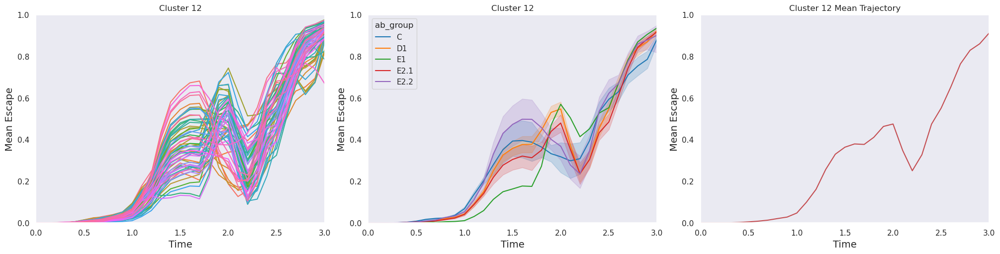

...

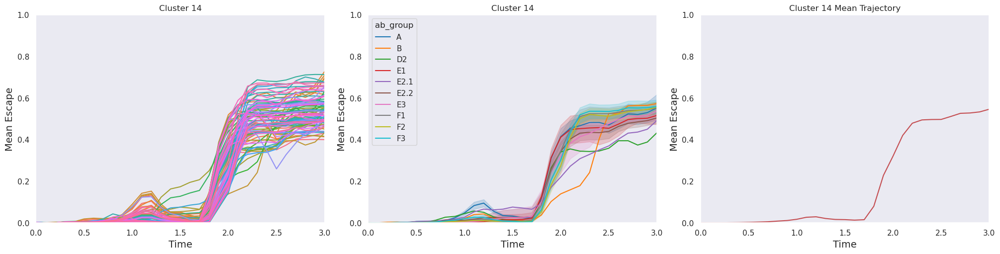

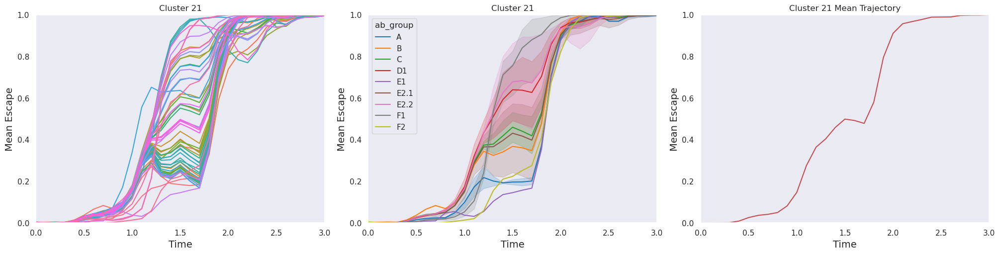

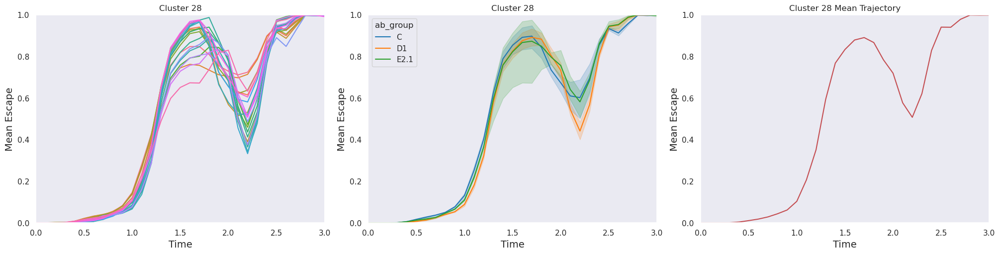

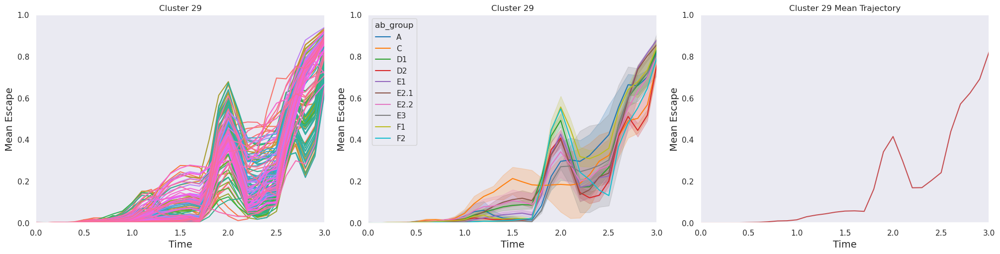

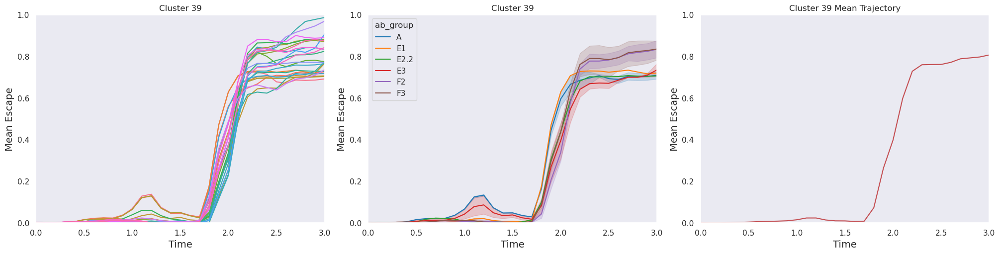

In [106]:
for cluster in range(num_clusters):
    # Filter the data for the current cluster
    cluster_df = merged_data[merged_data['cluster'] == cluster]

    if not cluster_df.empty:
        # Initialize a grid of 3 horizontal plots
        fig, axs = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)
        
        # Normal plot with all antibodies in the cluster
        sns.lineplot(data=cluster_df, x='time', y='mean_escape', hue='antibody', ax=axs[0], legend=False)
        axs[0].set_title(f'Cluster {cluster}')
        axs[0].set_xlabel('Time', fontsize=14)
        axs[0].set_ylabel('Mean Escape', fontsize=14)

        # Plot classified by antibody group
        sns.lineplot(data=cluster_df, x='time', y='mean_escape', hue='ab_group', palette='tab10', ax=axs[1])
        axs[1].set_title(f'Cluster {cluster}')
        axs[1].set_xlabel('Time', fontsize=14)
        axs[1].set_ylabel('Mean Escape', fontsize=14)

        # Plot displaying mean trajectory
        sns.lineplot(data=cluster_df, x='time', y='mean_escape', ci=None, estimator=np.mean, color='r', ax=axs[2])
        axs[2].set_title(f'Cluster {cluster} Mean Trajectory')
        axs[2].set_xlabel('Time', fontsize=14)
        axs[2].set_ylabel('Mean Escape', fontsize=14)
        
        # set x and y axis limits (adjust according to your specific data range)
        for ax in axs:
            ax.set_xlim([0, 3])  
            ax.set_ylim([0, 1])  
        
        # Show the plot
        plt.show()
        

Clusters here with headings represnted as hundereds are noise c

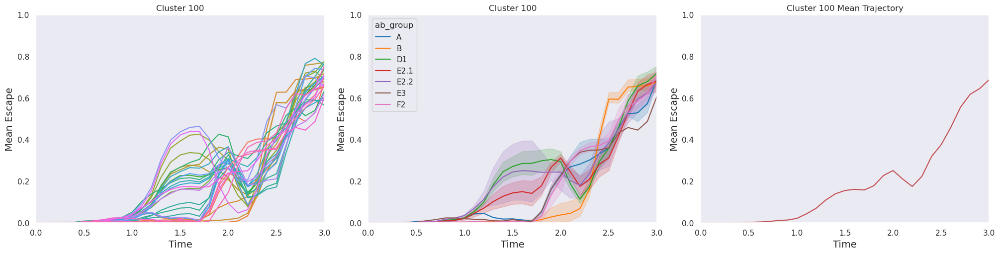

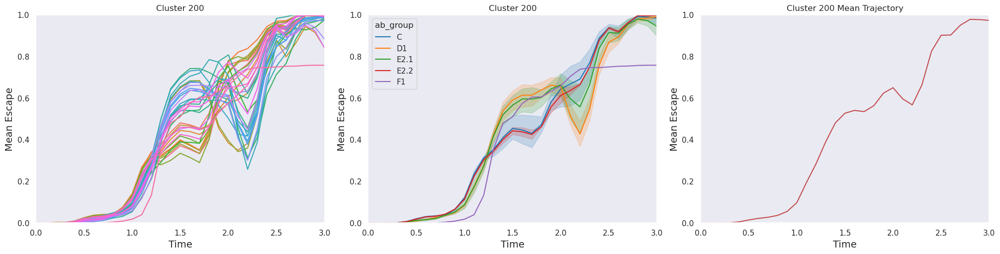

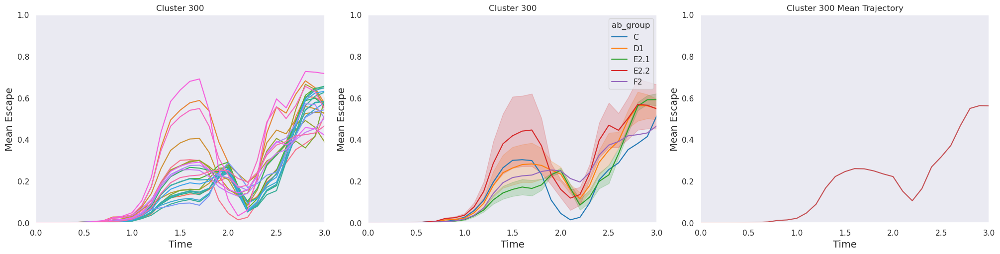

In [108]:
noise = [100,200,300]
for cluster in noise:
    # Filter the data for the current cluster
    cluster_df = merged_data[merged_data['cluster'] == cluster]

    if not cluster_df.empty:
        # Initialize a grid of 3 horizontal plots
        fig, axs = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)
        
        # Normal plot with all antibodies in the cluster
        sns.lineplot(data=cluster_df, x='time', y='mean_escape', hue='antibody', ax=axs[0], legend=False)
        axs[0].set_title(f'Cluster {cluster}')
        axs[0].set_xlabel('Time', fontsize=14)
        axs[0].set_ylabel('Mean Escape', fontsize=14)

        # Plot classified by antibody group
        sns.lineplot(data=cluster_df, x='time', y='mean_escape', hue='ab_group', palette='tab10', ax=axs[1])
        axs[1].set_title(f'Cluster {cluster}')
        axs[1].set_xlabel('Time', fontsize=14)
        axs[1].set_ylabel('Mean Escape', fontsize=14)

        # Plot displaying mean trajectory
        sns.lineplot(data=cluster_df, x='time', y='mean_escape', ci=None, estimator=np.mean, color='r', ax=axs[2])
        axs[2].set_title(f'Cluster {cluster} Mean Trajectory')
        axs[2].set_xlabel('Time', fontsize=14)
        axs[2].set_ylabel('Mean Escape', fontsize=14)
        
        # set x and y axis limits (adjust according to your specific data range)
        for ax in axs:
            ax.set_xlim([0, 3])  
            ax.set_ylim([0, 1])  
        
        # Show the plot
        plt.show()
        

Note, points considered to be as "noise points" by the HDBCAN algorithemn, have been left out, information and data about these noise points is in the K-Means-Clustering notebook